## Visualizing and understanding the data available.

In [3]:
# Install the necessary packages
!pip install torch torchvision albumentations tqdm opencv-python

# Import the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import os
from glob import glob
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from albumentations import HorizontalFlip, VerticalFlip, Rotate
import tqdm
import cv2

# Configure matplotlib
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
%matplotlib inline

/home/miguel/anaconda3/envs/gsoc-2025-1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Loading the dataset

In [4]:
train_data = pd.read_csv('uw-madison-gi-tract-image-segmentation/train.csv')

In [5]:
train_data.head()

,id,class,segmentation
0,case123_day20_slice_0001,large_bowel,NaN
1,case123_day20_slice_0001,small_bowel,NaN
2,case123_day20_slice_0001,stomach,NaN
3,case123_day20_slice_0002,large_bowel,NaN
4,case123_day20_slice_0002,small_bowel,NaN


In [ ]:
train_images = glob('uw-madison-gi-tract-image-segmentation/train/*/*/*/*')

# 0  /Users/  1   elizabethnemeti/   2 Desktop/   3  uw-madison-gi-tract-image-segmentation/   4 train/  5 */ 6 */ 7 */ 8*
#                                                 0 uw-madison-gi-tract-image-segmentation/    1 train/  2 */ 3 */ 4 */ 5*

In [7]:
len(train_images)

38496

In [8]:
train_images[0]

'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0091_360_310_1.50_1.50.png'

## Plotting a few images to visualize data randomly

**Each case has 144 scans, with a few being segmentation masks.
It is to be noted that not all cases have masks**

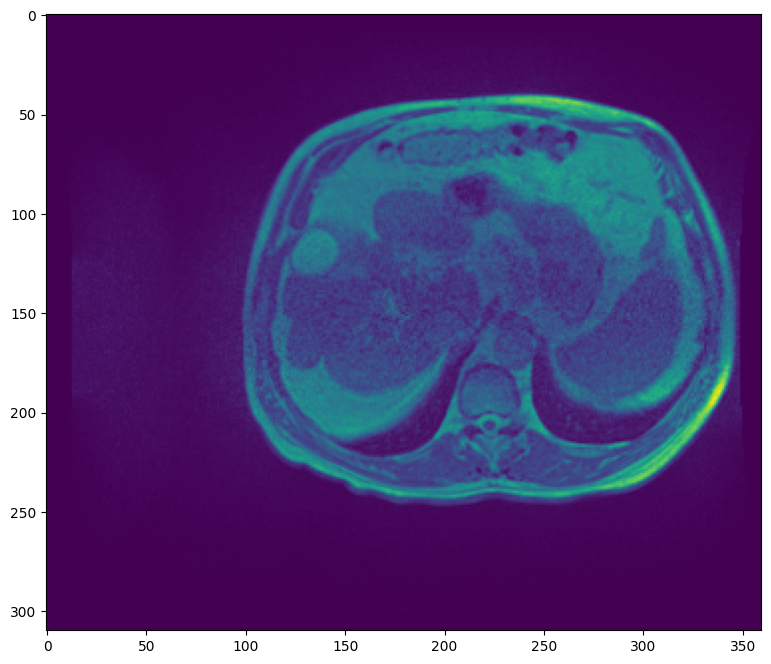

In [9]:
image = cv2.imread(train_images[0], cv2.IMREAD_UNCHANGED)
plt.imshow(image)

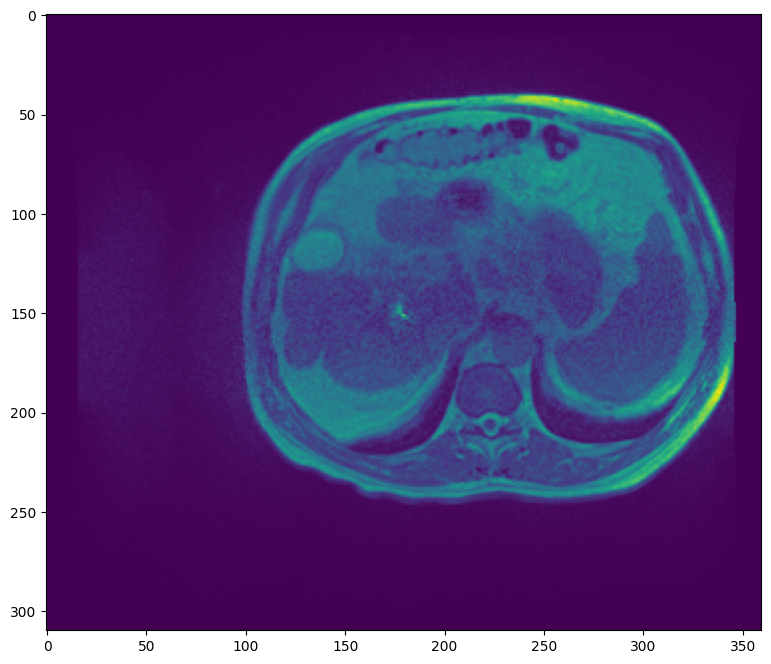

In [10]:
image = cv2.imread(train_images[143], cv2.IMREAD_UNCHANGED)
plt.imshow(image)

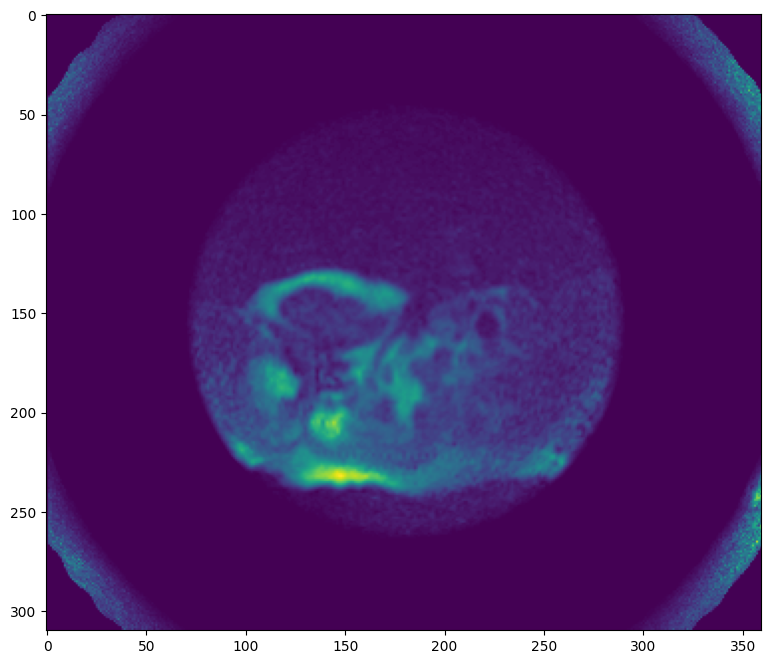

In [11]:
image = cv2.imread(train_images[1], cv2.IMREAD_UNCHANGED)
plt.imshow(image)

## Run Length Encoding (RLE) images decoding

The segmentation (where doesn't have the value nan) is formed by a list of numbers containing different pixel points and their length. As an example:

'28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6'

where:

28094, 28358, 28623 etc. are the startpoints of the pixels within the matrix
and 3, 7, 9, 9 etc. are how long to strech the startpoints - meaning the total length
hence we can compute the endpoint of each of these segments as the sum of startpoints + endpoints

In [154]:
def rle2mask(mask_rle, shape):
    if not mask_rle or mask_rle == '':
        return np.zeros(shape, dtype=np.uint8)
    
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0::2], s[1::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    
    for start, end in zip(starts, ends):
        img[start:end] = 1
    
    return img.reshape(shape)

Use `pathToInfo` to Extract Metadata for All Images

In [108]:
def pathToInfo(path):
    try:
        path_segments = path.split('/')
        if len(path_segments) < 10:
            raise ValueError("Path does not contain enough segments")
        print(path_segments)
        caseDay = path_segments[7]
        slice_no = path_segments[9].split('_')[1]
        id = caseDay + '_slice_' + slice_no
        details = path_segments[9].split('_')
        if len(details) < 6:
            raise ValueError("Path details segment does not contain enough parts")
        
        height = details[2]
        width = details[3]
        h_spacing = details[4]
        w_spacing = details[5][:-4]  # Remove the file extension
        
        return pd.Series([id, height, width, h_spacing, w_spacing])
    
    except IndexError:
        print(f"IndexError processing path: {path}")
        return pd.Series([None, None, None, None, None])
    except ValueError as ve:
        print(f"ValueError: {ve} for path: {path}")
        return pd.Series([None, None, None, None, None])

In [130]:
df

,id,stomach_rle,large_bowel_rle,small_bowel_rle
0,case123_day20_slice_0001,<NA>,<NA>,<NA>
1,case123_day20_slice_0002,<NA>,<NA>,<NA>
2,case123_day20_slice_0003,<NA>,<NA>,<NA>
3,case123_day20_slice_0004,<NA>,<NA>,<NA>
4,case123_day20_slice_0005,<NA>,<NA>,<NA>
...,...,...,...,...
38491,case30_day0_slice_0140,<NA>,<NA>,<NA>
38492,case30_day0_slice_0141,<NA>,<NA>,<NA>
38493,case30_day0_slice_0142,<NA>,<NA>,<NA>
38494,case30_day0_slice_0143,<NA>,<NA>,<NA>


In [77]:
train_images

['uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0091_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0002_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0062_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0001_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0106_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0032_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0078_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0105_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0015_360_310_1.50_1.50.png',
 'uw-madison-gi-tract-image-

In [110]:
# Create a DataFrame from the image paths
path_details_df = pd.DataFrame(train_images, columns=['path'])

# Apply the function to extract details and create columns for id, height, width, h_spacing, w_spacing
path_details_df[['id', 'height', 'width', 'h_spacing', 'w_spacing']] = path_details_df['path'].apply(func=lambda x: pathToInfo('/Users/elizabethnemeti/Desktop/' + x))

# Check the resulting DataFrame
path_details_df.head()

# Merge the new DataFrame with the existing one
new_df = df.merge(path_details_df, on='id')

# Save the new DataFrame to CSV
new_df.to_csv('./train_dataset.csv', index=False)

['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0091_360_310_1.50_1.50.png']
['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0002_360_310_1.50_1.50.png']
['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0062_360_310_1.50_1.50.png']
['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0001_360_310_1.50_1.50.png']
['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0106_360_310_1.50_1.50.png']
['', 'Users', 'elizabethnemeti', 'Desktop', 'uw-madison-gi-tract-image-segmentation', 'train', 'case88', 'case88_day38', 'scans', 'slice_0032_360_310_1.50_1.50.png']
['',

In [111]:
df

,id,stomach_rle,large_bowel_rle,small_bowel_rle
0,case123_day20_slice_0001,<NA>,<NA>,<NA>
1,case123_day20_slice_0002,<NA>,<NA>,<NA>
2,case123_day20_slice_0003,<NA>,<NA>,<NA>
3,case123_day20_slice_0004,<NA>,<NA>,<NA>
4,case123_day20_slice_0005,<NA>,<NA>,<NA>
...,...,...,...,...
38491,case30_day0_slice_0140,<NA>,<NA>,<NA>
38492,case30_day0_slice_0141,<NA>,<NA>,<NA>
38493,case30_day0_slice_0142,<NA>,<NA>,<NA>
38494,case30_day0_slice_0143,<NA>,<NA>,<NA>


In [112]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115488 entries, 0 to 115487
Data columns (total 3 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            115488 non-null  object
 1   class         115488 non-null  object
 2   segmentation  33913 non-null   object
dtypes: object(3)
memory usage: 2.6+ MB


In [113]:
train_seg = train_data.dropna()

In [114]:
train_seg.head()

,id,class,segmentation
194,case123_day20_slice_0065,stomach,28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...
197,case123_day20_slice_0066,stomach,27561 8 27825 11 28090 13 28355 14 28620 15 28...
200,case123_day20_slice_0067,stomach,15323 4 15587 8 15852 10 16117 11 16383 12 166...
203,case123_day20_slice_0068,stomach,14792 5 15056 9 15321 11 15587 11 15852 13 161...
206,case123_day20_slice_0069,stomach,14526 6 14789 12 15054 14 15319 16 15584 17 15...


In [115]:
train_seg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33913 entries, 194 to 115465
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            33913 non-null  object
 1   class         33913 non-null  object
 2   segmentation  33913 non-null  object
dtypes: object(3)
memory usage: 1.0+ MB


In [132]:
train_seg['segmentation'].iloc[0]

'28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6'

In [133]:
mask1 = rle2mask(train_seg['segmentation'].iloc[0], (266, 266))

[28093 28357 28622 28888 29154 29420 29686 29952 30218 30483 30749 31015
 31281 31547 31813 32080 32346 32613] [28096 28364 28631 28897 29163 29429 29695 29961 30227 30493 30759 31025
 31291 31557 31823 32089 32354 32619]


In [123]:
train_seg['segmentation'].iloc[0]

'28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6'

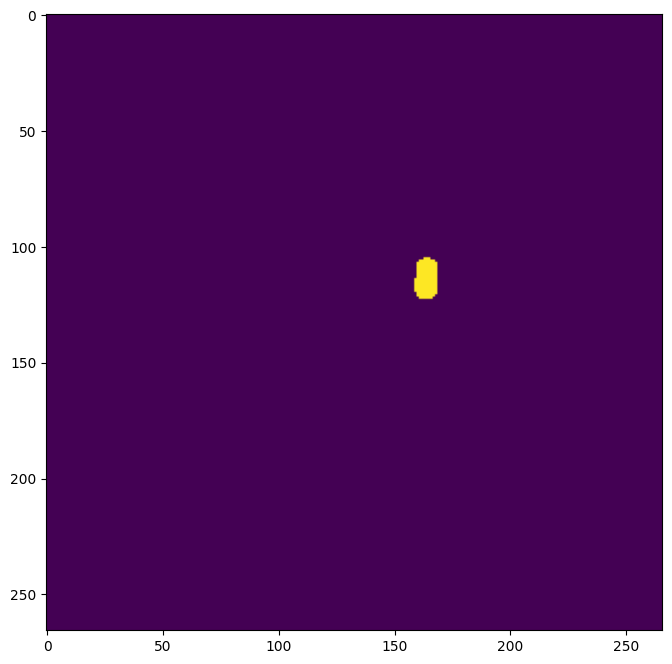

In [145]:
plt.imshow(mask1)

[14525 14788 15053 15318 15583 15849 16114 16380 16645 16911 17177 17443
 17709 17975 18241 18507 18773 19039 19305 19571 19837 20103 20369 20635
 20901 21167 21433 21699 21965 22231 22498 22764 23029 23295 23561 23826
 24092 24358 24624 24890 25155 25421 25687 25953 26218 26484 26750 27016
 27282 27547 27813 28078 28344 28609 28874 29140 29405 29670 29934 30198
 30463 30727 30992 31258 31524 31789 32055 32322 32588 32854 33121 33389
 33661 33931 34199 34466 34733 34999 35266 35533 35800 36066 36334] [14531 14800 15067 15334 15600 15867 16133 16399 16665 16931 17197 17463
 17729 17995 18261 18527 18793 19059 19325 19591 19857 20123 20389 20655
 20921 21187 21453 21719 21985 22251 22517 22783 23049 23315 23581 23847
 24113 24380 24646 24912 25178 25445 25711 25977 26243 26510 26776 27043
 27309 27575 27842 28108 28374 28640 28907 29173 29439 29705 29971 30237
 30503 30769 31035 31300 31565 31831 32096 32362 32628 32893 33159 33424
 33690 33956 34222 34488 34753 35018 35282 35547 35812 3

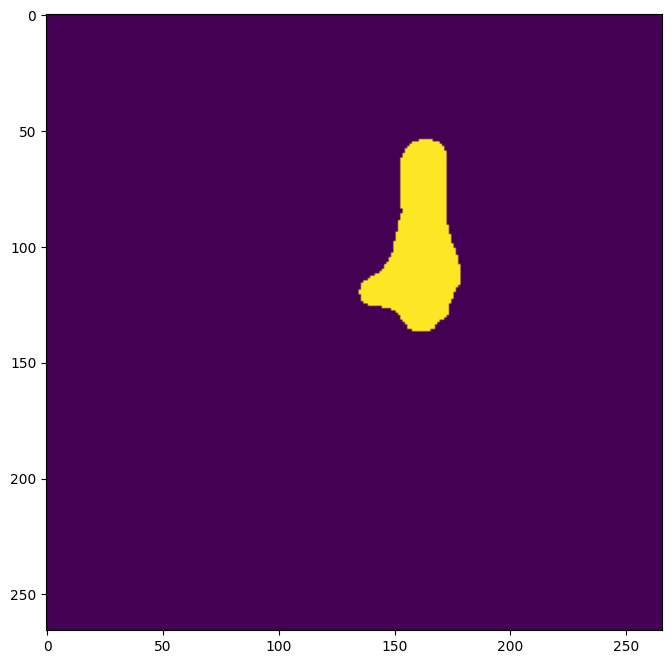

In [146]:
mask2 = rle2mask(train_seg['segmentation'].iloc[4], image.shape)
plt.imshow(mask2)

[15322 15586 15851 16116 16382 16648 16914 17180 17446 17712 17978 18244
 18510 18776 19042 19308 19574 19840 20106 20372 20638 20904 21170 21436
 21702 21968 22234 22500 22766 23032 23298 23564 23830 24096 24362 24628
 24894 25160 25426 25692 25958 26223 26488 26754 27019 27285 27551 27817
 28083 28349 28615 28881 29146 29412 29677 29943 30209 30475 30741 31007
 31273 31539 31805 32071 32337 32603 32870 33136 33402 33668 33935 34202
 34468 34735 35002 35270 35538] [15326 15594 15861 16127 16394 16660 16926 17192 17458 17724 17990 18256
 18522 18788 19054 19320 19586 19852 20118 20384 20650 20916 21182 21448
 21714 21980 22246 22512 22778 23044 23310 23576 23842 24108 24374 24640
 24906 25173 25439 25706 25972 26238 26504 26771 27038 27305 27572 27838
 28104 28371 28637 28903 29169 29435 29701 29967 30234 30500 30766 31032
 31298 31564 31830 32095 32361 32627 32892 33158 33423 33689 33954 34219
 34482 34747 35013 35278 35541]


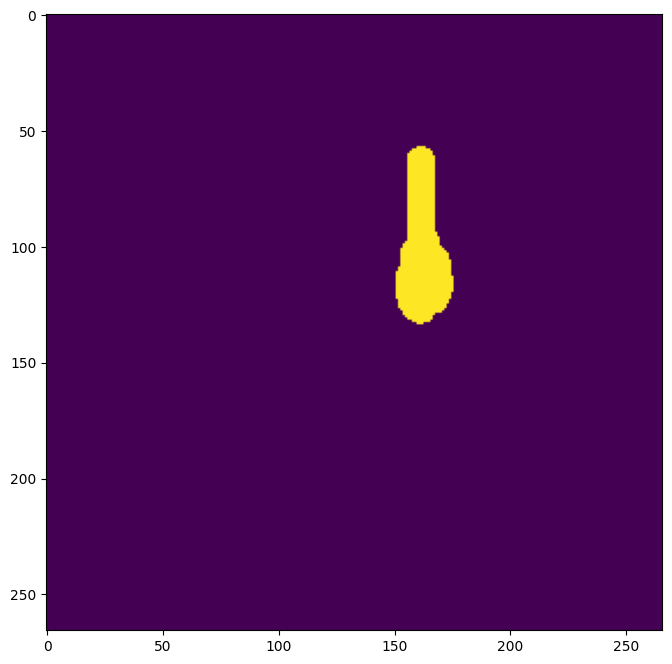

In [147]:
mask3 = rle2mask(train_seg['segmentation'].iloc[2], image.shape)
plt.imshow(mask3)

[14791 15055 15320 15586 15851 16117 16382 16648 16914 17179 17445 17711
 17977 18243 18509 18775 19041 19307 19573 19839 20105 20371 20637 20903
 21169 21435 21701 21967 22233 22499 22765 23031 23297 23563 23829 24095
 24361 24627 24893 25158 25424 25690 25955 26220 26486 26751 27016 27282
 27548 27814 28080 28346 28612 28877 29143 29408 29673 29938 30200 30464
 30728 30992 31257 31522 31787 32053 32319 32585 32851 33117 33384 33651
 33919 33927 34194 34461 34728 34995 35267 35534 35802] [14796 15064 15331 15597 15864 16130 16397 16663 16929 17195 17461 17727
 17993 18259 18525 18791 19057 19323 19589 19855 20121 20387 20653 20919
 21185 21451 21717 21983 22249 22515 22781 23047 23314 23580 23846 24112
 24378 24644 24910 25176 25442 25709 25975 26241 26508 26774 27041 27307
 27573 27840 28106 28372 28639 28905 29171 29437 29703 29970 30236 30502
 30768 31033 31299 31565 31831 32097 32363 32629 32894 33160 33425 33691
 33926 33956 34222 34487 34751 35014 35279 35544 35809]
14792 5 1505

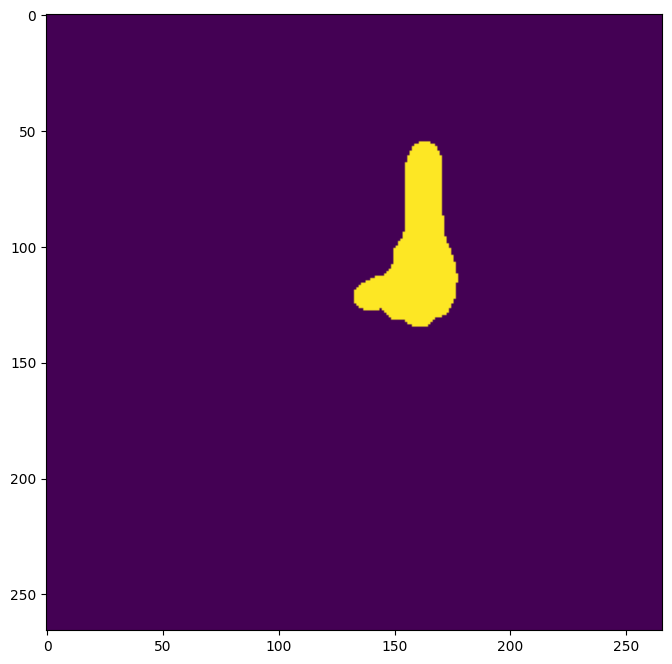

In [148]:
mask4 = rle2mask(train_seg['segmentation'].iloc[3], image.shape)
print(train_seg['segmentation'].iloc[3])
plt.imshow(mask4)

In [56]:
test=pd.read_csv('data.csv')

In [57]:
print(test[test['id'].str.contains('case123_day20_slice_0065')].stomach_rle.values)

['28094 3 28358 7 28623 9 28889 9 29155 9 29421 9 29687 9 29953 9 30219 9 30484 10 30750 10 31016 10 31282 10 31548 10 31814 10 32081 9 32347 8 32614 6']


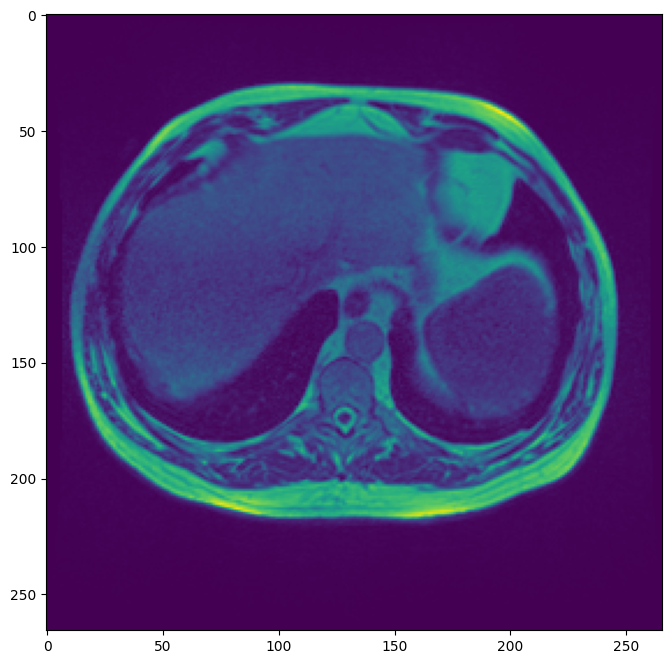

In [143]:
image = cv2.imread(r'uw-madison-gi-tract-image-segmentation/train/case123/case123_day20/scans/slice_0065_266_266_1.50_1.50.png', cv2.IMREAD_UNCHANGED)
plt.imshow(image)

(310, 360)

[28093 28357 28622 28888 29154 29420 29686 29952 30218 30483 30749 31015
 31281 31547 31813 32080 32346 32613] [28096 28364 28631 28897 29163 29429 29695 29961 30227 30493 30759 31025
 31291 31557 31823 32089 32354 32619]


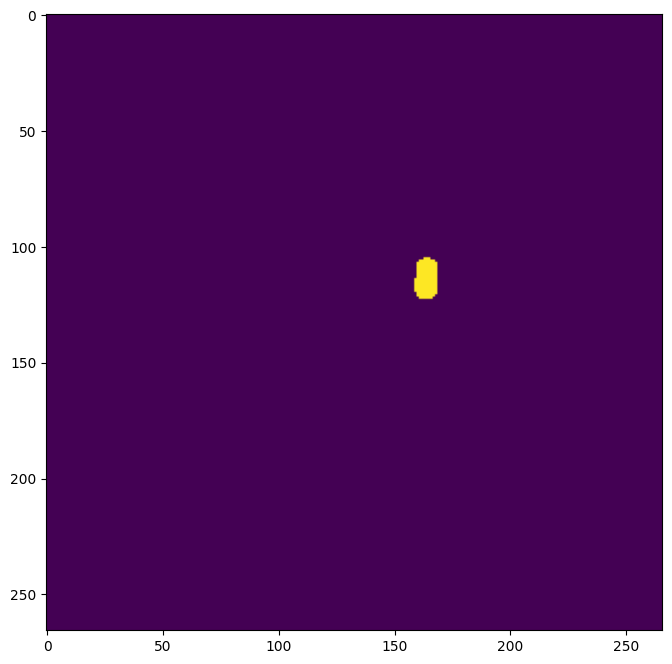

In [144]:
test_mask = rle2mask(test[test['id'].str.contains('case123_day20_slice_0065')].stomach_rle.values[0], image.shape)
plt.imshow(test_mask)

In [61]:
test=pd.read_csv('data.csv')
test_clean= test.dropna(subset=['stomach_rle','large_bowel_rle','small_bowel_rle'], thresh=1)

In [168]:
test

,id,stomach_rle,large_bowel_rle,small_bowel_rle
0,case123_day20_slice_0001,NaN,NaN,NaN
1,case123_day20_slice_0002,NaN,NaN,NaN
2,case123_day20_slice_0003,NaN,NaN,NaN
3,case123_day20_slice_0004,NaN,NaN,NaN
4,case123_day20_slice_0005,NaN,NaN,NaN
...,...,...,...,...
38491,case30_day0_slice_0140,NaN,NaN,NaN
38492,case30_day0_slice_0141,NaN,NaN,NaN
38493,case30_day0_slice_0142,NaN,NaN,NaN
38494,case30_day0_slice_0143,NaN,NaN,NaN


In [ ]:
# import shutil, os



# path = r'./stomach_data_and_masks'
# os.makedirs(path, exist_ok=True)

# for index, row in test_clean.iterrows():
#     id_full = row.id
#     id = id_full.split('_')
#     files = os.listdir(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans')
#     for file in os.listdir(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans'):
#         split_file_name = file.split('_')
#         if split_file_name[1]==id[3]:
#             shutil.copyfile(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/{file}', f'{path}/{id_full}.png')
            
    
#     #img_path = rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png'
#     #shutil.copyfile(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png', f'{path}/{id_full}')
#     #plt.imshow(image)
#     #plt.savefig(f'{path}/{id_full}' )

In [ ]:
# for index, row in tqdm(test_clean.iterrows()):
#     id_full = row.id
#     if type(row.stomach_rle)==str:
#         width = int(new_df.set_index('id').loc[row['id']]['width'])
#         height = int(new_df.set_index('id').loc[row['id']]['height'])

#         test_mask = rle2mask(row.stomach_rle, (width, height))
#         plt.imshow(test_mask)
#         plt.axis('off')
#         plt.savefig(f'./stomach_data_and_masks/{id_full}_stomach_mask.png', bbox_inches='tight', pad_inches=0)

#     # if type(row.large_bowel_rle)==str:
#     #     test_mask = rle2mask(row.large_bowel_rle, image.shape)
#     #     plt.imshow(test_mask)
#     #     plt.axis('off')
#     #     plt.savefig(f'./all_masks/{id_full}_large_bowel_mask.png', bbox_inches='tight', pad_inches=0)
#     #     print('saved large bowel')

#     # if type(row.small_bowel_rle)==str:
#     #     test_mask = rle2mask(row.small_bowel_rle, image.shape)
#     #     plt.imshow(test_mask)
#     #     plt.axis('off')
#     #     plt.savefig(f'./all_masks/{id_full}_small_bowel_mask.png', bbox_inches='tight', pad_inches=0)
#     #     print('saved small bowel')

In [209]:
# Used in stomach_data_and_masks_preparation folder

test_clean.to_csv('stomach_data_and_masks_preparation/data/test_clean.csv')
new_df.to_csv('stomach_data_and_masks_preparation/data/new_df.csv')

  0%|          | 55/16590 [01:22<6:54:02,  1.50s/it] 


KeyboardInterrupt: 

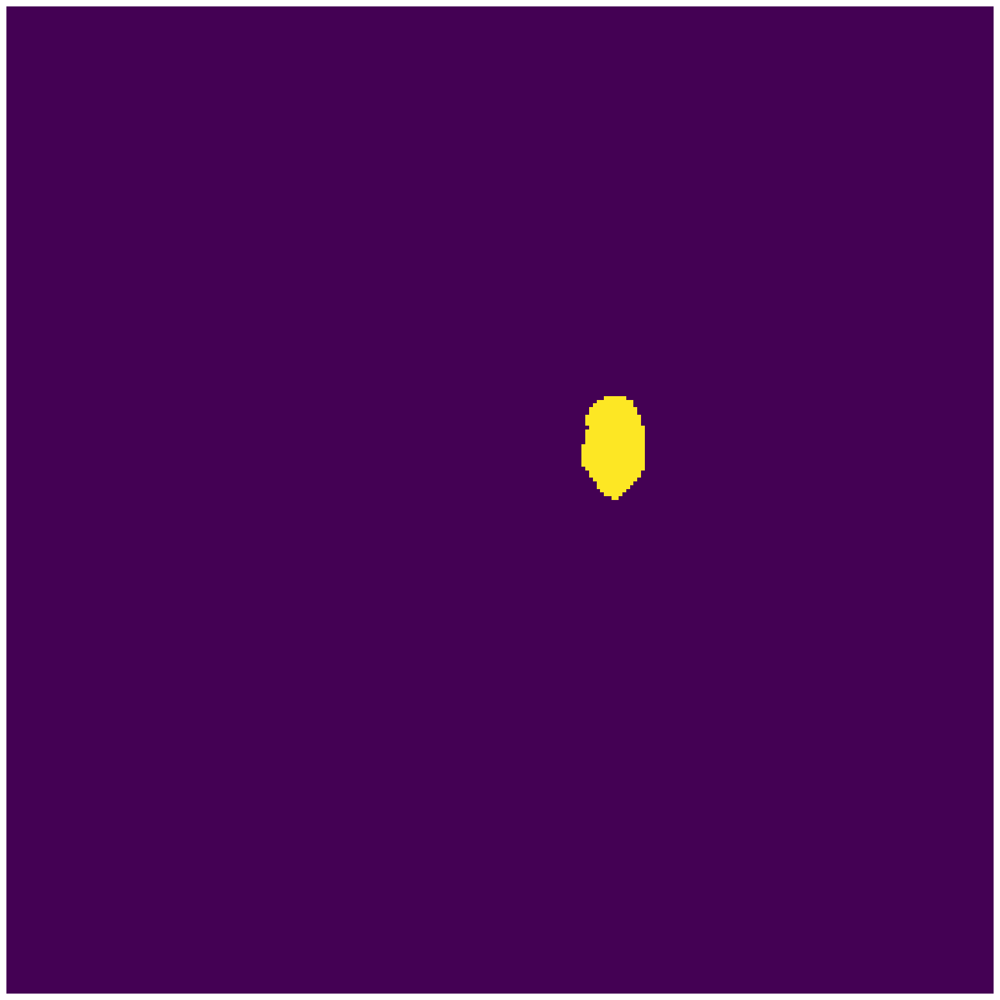

In [207]:
import shutil, os



path = r'./stomach_data_and_masks_raw'
os.makedirs(path, exist_ok=True)

for index, row in tqdm(test_clean.iterrows(), total=len(test_clean)):
    id_full = row.id
    os.makedirs(f"{path}/{id_full}", exist_ok=True)
    id = id_full.split('_')
    files = os.listdir(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans')
    for file in os.listdir(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans'):
        split_file_name = file.split('_')
        if split_file_name[1]==id[3]:
            shutil.copyfile(rf'uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/{file}', f'{path}/{id_full}/{id_full}.png')
            break

    if type(row.stomach_rle)==str:
        width = int(new_df.set_index('id').loc[row['id']]['width'])
        height = int(new_df.set_index('id').loc[row['id']]['height'])

        test_mask = rle2mask(row.stomach_rle, (width, height))
        plt.imshow(test_mask)
        plt.axis('off')
        plt.savefig(f'./stomach_data_and_masks_raw/{id_full}/{id_full}_stomach_mask.png', bbox_inches='tight', pad_inches=0)

    # if type(row.large_bowel_rle)==str:
    #     test_mask = rle2mask(row.large_bowel_rle, image.shape)
    #     plt.imshow(test_mask)
    #     plt.axis('off')
    #     plt.savefig(f'./all_masks/{id_full}_large_bowel_mask.png', bbox_inches='tight', pad_inches=0)
    #     print('saved large bowel')

    # if type(row.small_bowel_rle)==str:
    #     test_mask = rle2mask(row.small_bowel_rle, image.shape)
    #     plt.imshow(test_mask)
    #     plt.axis('off')
    #     plt.savefig(f'./all_masks/{id_full}_small_bowel_mask.png', bbox_inches='tight', pad_inches=0)
    #     print('saved small bowel')
    
        

   
    
    #img_path = rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png'
    #shutil.copyfile(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png', f'{path}/{id_full}')
    #plt.imshow(image)
    #plt.savefig(f'{path}/{id_full}' )

In [ ]:
import shutil, os



path = r'./stomach_data_and_masks'

for index, row in test_clean.iterrows():
    id_full = row.id
    id = id_full.split('_')
    files = os.listdir(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans')
    for file in os.listdir(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans'):
        split_file_name = file.split('_')
        if split_file_name[1]==id[3]:
            shutil.copyfile(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/{file}', f'{path}/{id_full}.png')
            break
            
        
    
    #img_path = rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png'
    #shutil.copyfile(rf'/Users/elizabethnemeti/Desktop/uw-madison-gi-tract-image-segmentation/train/{id[0]}/{id[0]}_{id[1]}/scans/slice_{id[3]}_266_266_1.50_1.50.png', f'{path}/{id_full}')
    #plt.imshow(image)
    #plt.savefig(f'{path}/{id_full}' )

KeyboardInterrupt: 

In [179]:
new_df.set_index('id').loc[row['id']]['height']

'266'

2it [00:00,  6.99it/s]

saved stomach
saved stomach


3it [00:00,  5.60it/s]

saved stomach


4it [00:00,  4.54it/s]

saved stomach


5it [00:01,  3.69it/s]

saved stomach


6it [00:01,  3.12it/s]

saved stomach


7it [00:02,  2.67it/s]

saved stomach


8it [00:02,  2.33it/s]

saved stomach


9it [00:03,  2.06it/s]

saved stomach


10it [00:03,  1.84it/s]

saved stomach


11it [00:04,  1.66it/s]

saved stomach


12it [00:05,  1.51it/s]

saved stomach


13it [00:06,  1.38it/s]

saved stomach


14it [00:07,  1.27it/s]

saved stomach


15it [00:08,  1.18it/s]

saved stomach


16it [00:09,  1.09it/s]

saved stomach


17it [00:10,  1.02it/s]

saved stomach


18it [00:11,  1.04s/it]

saved stomach


19it [00:12,  1.11s/it]

saved stomach


20it [00:14,  1.17s/it]

saved stomach


21it [00:15,  1.24s/it]

saved stomach


22it [00:16,  1.30s/it]

saved stomach


23it [00:18,  1.37s/it]

saved stomach


24it [00:20,  1.43s/it]

saved stomach


25it [00:21,  1.50s/it]

saved stomach


26it [00:23,  1.57s/it]

saved stomach


27it [00:25,  1.64s/it]

saved stomach


28it [00:27,  1.70s/it]

saved stomach


29it [00:29,  1.77s/it]

saved stomach


Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x7e3db07fc220>
Traceback (most recent call last):
  File "/home/miguel/anaconda3/envs/gsoc-2025-1/lib/python3.12/site-packages/matplotlib/transforms.py", line 195, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id_self: pop(k))

KeyboardInterrupt: 
30it [00:31,  1.84s/it]

saved stomach


31it [00:33,  1.89s/it]

saved stomach


32it [00:35,  1.98s/it]

saved stomach


55it [00:37,  3.71it/s]

saved stomach


56it [00:39,  2.66it/s]

saved stomach


57it [00:42,  1.94it/s]

saved stomach


58it [00:44,  1.44it/s]

saved stomach


58it [00:46,  1.24it/s]


KeyboardInterrupt: 

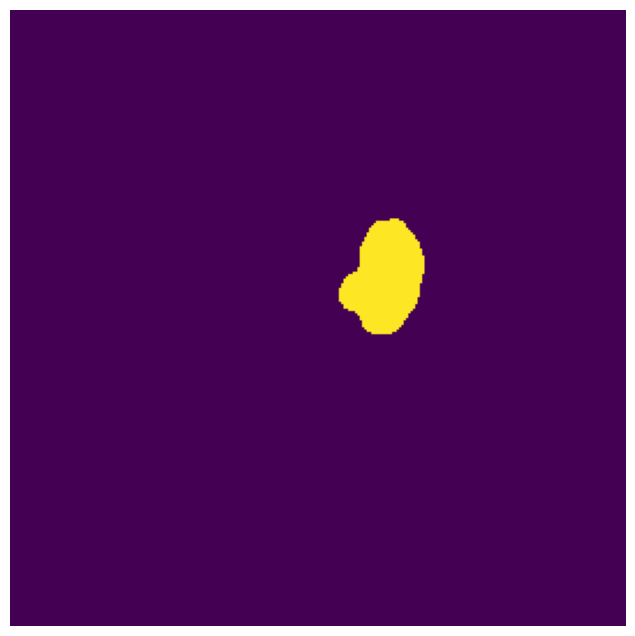

In [186]:
for file in os.listdir(rf'./all_masks/'):
    if file.split('_')[-1] =='rle.png':
        new_name = file.split('rle')[0]
        new_name = f'{new_name}_mask.png'
        print(new_name)
        #os.rename(file, new_name)

FileNotFoundError: [Errno 2] No such file or directory: './all_masks/'

## Moving towards making a little more sense of masks

In [187]:
train_seg['class'].value_counts()

class
large_bowel    14085
small_bowel    11201
stomach         8627
Name: count, dtype: int64

In [188]:
train_seg[['case', 'day','_', 'slice']] = train_seg['id'].str.split('_', expand=True)

/tmp/ipykernel_2594726/3778118854.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_seg[['case', 'day','_', 'slice']] = train_seg['id'].str.split('_', expand=True)
/tmp/ipykernel_2594726/3778118854.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_seg[['case', 'day','_', 'slice']] = train_seg['id'].str.split('_', expand=True)
/tmp/ipykernel_2594726/3778118854.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_index

In [189]:
train_seg.drop('_', axis=1, inplace=True)

/tmp/ipykernel_2594726/3157862534.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_seg.drop('_', axis=1, inplace=True)


In [190]:
train_seg.head()

,id,class,segmentation,case,day,slice
194,case123_day20_slice_0065,stomach,28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...,case123,day20,0065
197,case123_day20_slice_0066,stomach,27561 8 27825 11 28090 13 28355 14 28620 15 28...,case123,day20,0066
200,case123_day20_slice_0067,stomach,15323 4 15587 8 15852 10 16117 11 16383 12 166...,case123,day20,0067
203,case123_day20_slice_0068,stomach,14792 5 15056 9 15321 11 15587 11 15852 13 161...,case123,day20,0068
206,case123_day20_slice_0069,stomach,14526 6 14789 12 15054 14 15319 16 15584 17 15...,case123,day20,0069


In [191]:
train_seg['case'] = train_seg['case'].str.replace('case', '')

/tmp/ipykernel_2594726/2314378466.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_seg['case'] = train_seg['case'].str.replace('case', '')


In [192]:
train_seg['day'] = train_seg['day'].str.replace('day', '')

/tmp/ipykernel_2594726/93224464.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_seg['day'] = train_seg['day'].str.replace('day', '')


In [193]:
train_seg.head()

,id,class,segmentation,case,day,slice
194,case123_day20_slice_0065,stomach,28094 3 28358 7 28623 9 28889 9 29155 9 29421 ...,123,20,0065
197,case123_day20_slice_0066,stomach,27561 8 27825 11 28090 13 28355 14 28620 15 28...,123,20,0066
200,case123_day20_slice_0067,stomach,15323 4 15587 8 15852 10 16117 11 16383 12 166...,123,20,0067
203,case123_day20_slice_0068,stomach,14792 5 15056 9 15321 11 15587 11 15852 13 161...,123,20,0068
206,case123_day20_slice_0069,stomach,14526 6 14789 12 15054 14 15319 16 15584 17 15...,123,20,0069


In [194]:
train_data['id'].value_counts()

id
case30_day0_slice_0128      3
case30_day0_slice_0127      3
case30_day0_slice_0126      3
case30_day0_slice_0125      3
case30_day0_slice_0124      3
                           ..
case123_day20_slice_0005    3
case123_day20_slice_0004    3
case123_day20_slice_0003    3
case123_day20_slice_0002    3
case123_day20_slice_0001    3
Name: count, Length: 38496, dtype: int64

In [195]:
enum = ['stomach', 'large_bowel', 'small_bowel']

In [196]:
unique_ids = train_data['id'].unique()

In [26]:
unique_ids

array(['case123_day20_slice_0001', 'case123_day20_slice_0002',
       'case123_day20_slice_0003', ..., 'case30_day0_slice_0142',
       'case30_day0_slice_0143', 'case30_day0_slice_0144'], dtype=object)

In [27]:
for id in unique_ids:
    idx = train_data[train_data.id == id]
    print(idx)
    break

                         id        class segmentation
0  case123_day20_slice_0001  large_bowel          NaN
1  case123_day20_slice_0001  small_bowel          NaN
2  case123_day20_slice_0001      stomach          NaN


In [28]:
df = pd.DataFrame()
df['id'] = unique_ids
df['stomach_rle'] = pd.Series(dtype='string')
df['large_bowel_rle'] = pd.Series(dtype='string')
df['small_bowel_rle'] = pd.Series(dtype='string')

In [32]:
from tqdm import tqdm

In [33]:
len(unique_ids)

38496

TODO: Vectorize the following code for speed up

In [34]:
for i, id in tqdm(enumerate(unique_ids)):
    idx = train_data[train_data.id == id]
    for index, row in idx.iterrows():
        rle = row['segmentation']
        if row['class'] == 'stomach':
            df.at[i,'stomach_rle'] = rle
        elif row['class'] == 'large_bowel':
            df.at[i,'large_bowel_rle'] = rle
        elif row['class'] == 'small_bowel':
            df.at[i,'small_bowel_rle'] = rle

0it [00:00, ?it/s]

38496it [02:48, 229.04it/s]


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38496 entries, 0 to 38495
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               38496 non-null  object
 1   stomach_rle      8627 non-null   string
 2   large_bowel_rle  14085 non-null  string
 3   small_bowel_rle  11201 non-null  string
dtypes: object(1), string(3)
memory usage: 1.2+ MB


Above data indicates that most scans don't have masks

Saving the df to csv, as the above code is for readibility purposes and hence not the most efficient code. 

In [41]:
df.to_csv('./data.csv', index=False)

In [42]:
train_images[0]

'uw-madison-gi-tract-image-segmentation/train/case88/case88_day38/scans/slice_0091_360_310_1.50_1.50.png'

We need to add all these paths to our dataset against their respective cases for easy access of images

In [43]:
df.head()

,id,stomach_rle,large_bowel_rle,small_bowel_rle
0,case123_day20_slice_0001,<NA>,<NA>,<NA>
1,case123_day20_slice_0002,<NA>,<NA>,<NA>
2,case123_day20_slice_0003,<NA>,<NA>,<NA>
3,case123_day20_slice_0004,<NA>,<NA>,<NA>
4,case123_day20_slice_0005,<NA>,<NA>,<NA>


Now we can add all these paths to our dataframe

In [197]:
path_details_df.head()

,path,id,height,width,h_spacing,w_spacing
0,uw-madison-gi-tract-image-segmentation/train/c...,case88_day38_slice_0091,360,310,1.50,1.50
1,uw-madison-gi-tract-image-segmentation/train/c...,case88_day38_slice_0002,360,310,1.50,1.50
2,uw-madison-gi-tract-image-segmentation/train/c...,case88_day38_slice_0062,360,310,1.50,1.50
3,uw-madison-gi-tract-image-segmentation/train/c...,case88_day38_slice_0001,360,310,1.50,1.50
4,uw-madison-gi-tract-image-segmentation/train/c...,case88_day38_slice_0106,360,310,1.50,1.50


Now we merge this path_details_df with our previous data df, to have a final dataset

In [198]:
new_df = df.merge(path_details_df, on ='id')
new_df.head()

,id,stomach_rle,large_bowel_rle,small_bowel_rle,path,height,width,h_spacing,w_spacing
0,case123_day20_slice_0001,<NA>,<NA>,<NA>,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
1,case123_day20_slice_0002,<NA>,<NA>,<NA>,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
2,case123_day20_slice_0003,<NA>,<NA>,<NA>,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
3,case123_day20_slice_0004,<NA>,<NA>,<NA>,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
4,case123_day20_slice_0005,<NA>,<NA>,<NA>,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50


Save this dataframe to a csv to reduce computation time later.

In [199]:
new_df.to_csv('./train_dataset.csv')
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38496 entries, 0 to 38495
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               38496 non-null  object
 1   stomach_rle      8627 non-null   string
 2   large_bowel_rle  14085 non-null  string
 3   small_bowel_rle  11201 non-null  string
 4   path             38496 non-null  object
 5   height           38496 non-null  object
 6   width            38496 non-null  object
 7   h_spacing        38496 non-null  object
 8   w_spacing        38496 non-null  object
dtypes: object(6), string(3)
memory usage: 2.6+ MB


Plotting scans and their masks

In [200]:
new_df = new_df.fillna('')

In [201]:
new_df.head()

,id,stomach_rle,large_bowel_rle,small_bowel_rle,path,height,width,h_spacing,w_spacing
0,case123_day20_slice_0001,,,,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
1,case123_day20_slice_0002,,,,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
2,case123_day20_slice_0003,,,,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
3,case123_day20_slice_0004,,,,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50
4,case123_day20_slice_0005,,,,uw-madison-gi-tract-image-segmentation/train/c...,266,266,1.50,1.50


id                                          case123_day20_slice_0085
stomach_rle        11043 16 11307 20 11572 23 11837 25 12102 27 1...
large_bowel_rle    16950 2 17214 7 17479 10 17491 4 17744 19 1800...
small_bowel_rle    21435 7 21699 10 21965 11 22230 13 22496 14 22...
path               uw-madison-gi-tract-image-segmentation/train/c...
height                                                           266
width                                                            266
h_spacing                                                       1.50
w_spacing                                                       1.50
Name: 84, dtype: object


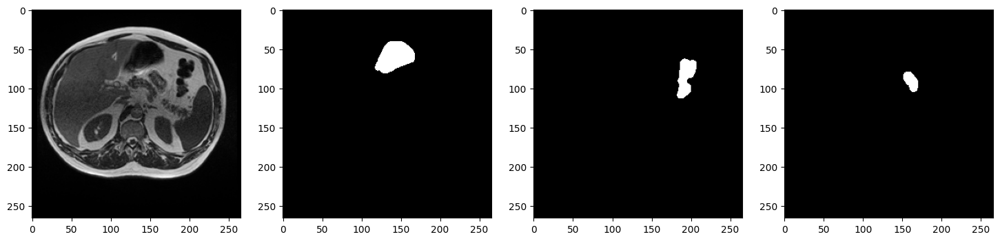

In [202]:
for idx, row in new_df[(new_df['stomach_rle'] != '')].iloc[20:21,:].iterrows():
    fig, axis = plt.subplots(1,4)
    image = cv2.imread(row['path'], cv2.IMREAD_UNCHANGED)
    axis[0].imshow(image, cmap='gray')
    axis[1].imshow(rle2mask(row['stomach_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[2].imshow(rle2mask(row['large_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[3].imshow(rle2mask(row['small_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    print(row)

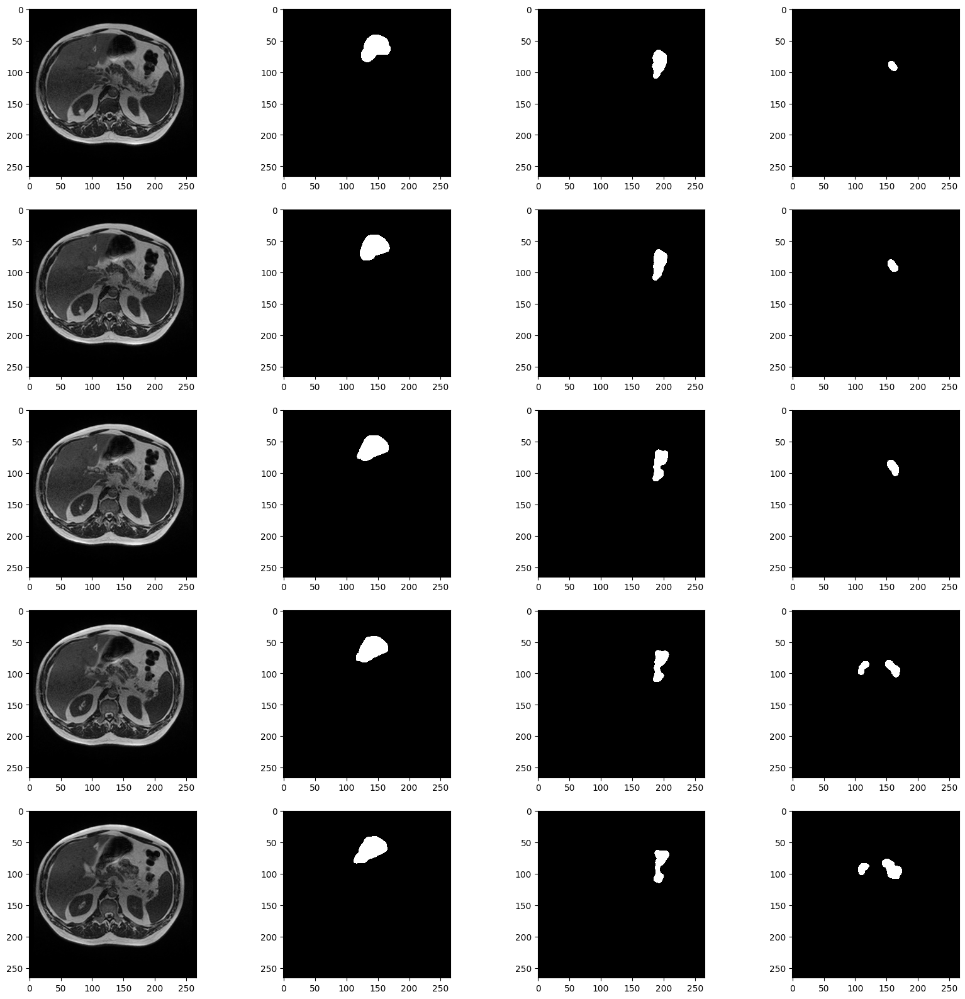

In [203]:
rcParams['figure.figsize'] = 20, 20
fig, axis = plt.subplots(5,4)
i = 0
for idx, row in new_df[new_df['stomach_rle'] != ''].iloc[18:23,:].iterrows():
    image = cv2.imread(row['path'], cv2.IMREAD_UNCHANGED)
    axis[i,0].imshow(image, cmap='gray')
    axis[i,1].imshow(rle2mask(row['stomach_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[i,2].imshow(rle2mask(row['large_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[i,3].imshow(rle2mask(row['small_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    i += 1

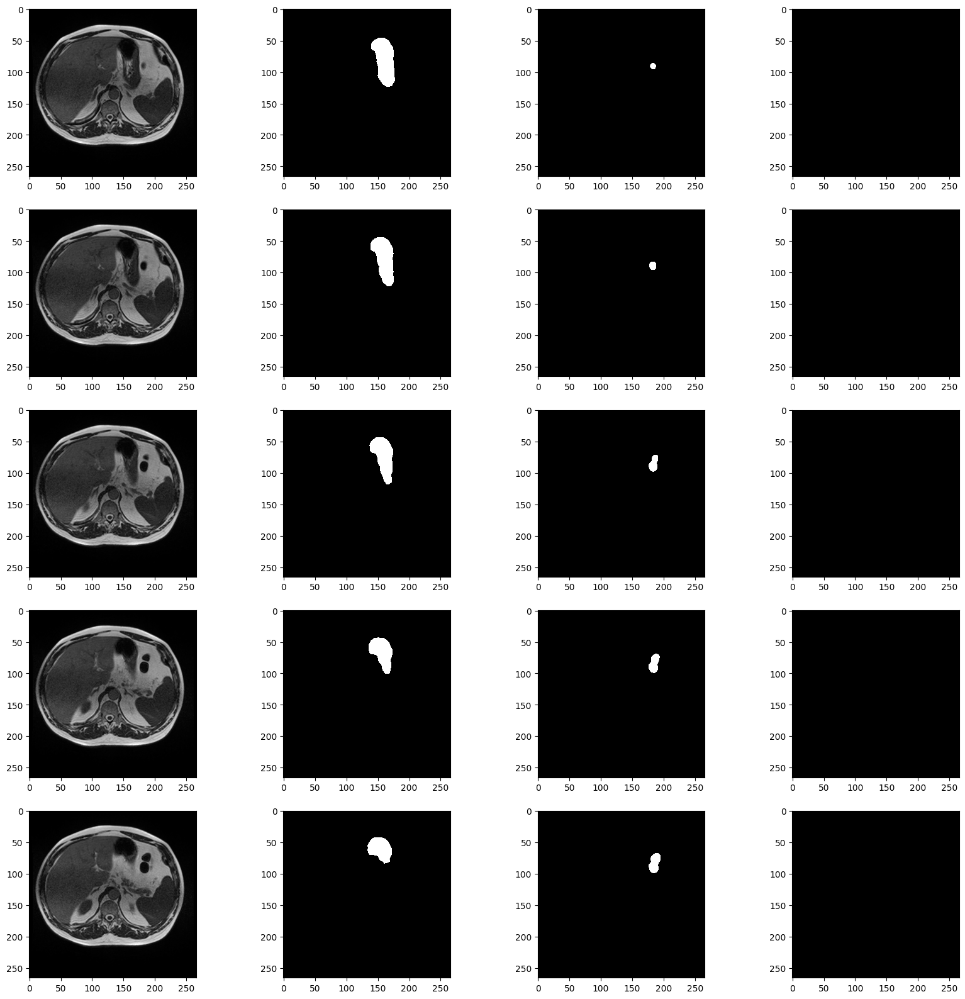

In [204]:
rcParams['figure.figsize'] = 20, 20
fig, axis = plt.subplots(5,4)
i = 0
for idx, row in new_df[new_df['stomach_rle'] != ''].iloc[10:15,:].iterrows():
    image = cv2.imread(row['path'], cv2.IMREAD_UNCHANGED)
    axis[i,0].imshow(image, cmap='gray')
    axis[i,1].imshow(rle2mask(row['stomach_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[i,2].imshow(rle2mask(row['large_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    axis[i,3].imshow(rle2mask(row['small_bowel_rle'], (int(row['width']), int(row['height']))), cmap='gray')
    i += 1

In [ ]:
rcParams['figure.figsize'] = 10,20
fig, axis = plt.subplots(5,2)
i = 0
for idx, row in new_df[(new_df['stomach_rle'] != '')].iloc[18:23,:].iterrows():
    image = cv2.imread(row['path'], cv2.IMREAD_UNCHANGED)
    axis[i,0].imshow(image, cmap='gray')
    s_mask = rle2mask(row['stomach_rle'], (int(row['width']), int(row['height'])))
    lb_mask = rle2mask(row['large_bowel_rle'], (int(row['width']), int(row['height'])))
    sb_mask = rle2mask(row['small_bowel_rle'], (int(row['width']), int(row['height'])))
    
    mask = s_mask + lb_mask + sb_mask
    
    axis[i,1].imshow(mask, cmap='gray')
    i += 1